In [1]:
import multiprocessing
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt

import tensorflow as tf

import sys
sys.path.append("/Users/achakrab/Desktop/ecrp/githubcode")
import pathsig

import torch
import signatory

import nnmodule

from scipy.spatial.distance import euclidean
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredError
from tensorflow import gather


from scipy.signal import welch
import torch.optim as optim
from torch import nn
import torch.nn.functional as F

from sklearn.model_selection import KFold
import math
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import rpy2.robjects as robjects
from rpy2.robjects import r
from rpy2.robjects import pandas2ri
from pykrige.ok import OrdinaryKriging
from scipy.interpolate import griddata
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import natural_earth, Reader
import itertools
from matplotlib.lines import Line2D
import statsmodels.api as sm
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform


multiprocessing.cpu_count()


12

# Load model data

In [65]:
hours=24
days=30
locations=3000
model_tensor = torch.rand(days, hours, locations)

model_numpy = model_tensor.cpu().detach().numpy()
# Reshape: (locations, days*hours)
flattened_model = model_numpy.reshape(days * hours, locations).T

print(flattened_model.shape)  # (locations, days*hours)



#Random latitude in [-90, 90]
lat_flat = (torch.rand(locations) * 180) - 90  

# Random longitude in [-180, 180]
long_flat = (torch.rand(locations) * 360) - 180  

(3000, 720)


# Load observational data

In [81]:
obslocations=12
obs_tensor = torch.rand(days, hours, obslocations)
obsstack=np.vstack([obs_tensor[:, :, i] for i in range(obs_tensor.shape[2])])

#12 random latitudes [-90, 90]
lat_obs = (torch.rand(12) * 180) - 90  

# 12 random longitudes [-180, 180]
lon_obs = (torch.rand(12) * 360) - 180  



# Evaluate the path signatures

In [7]:
print(f"Original data shape: {model_tensor.shape}")
add_time = pathsig.AddTime()
append_zero=pathsig.AppendZero()
transformed_ts = add_time.fit_transform(model_tensor)
print(f"After adding time as another channel: {transformed_ts.shape}")
final_transformed_ts= append_zero.transform(transformed_ts)
print(f"Augmenting with 0 in time: {final_transformed_ts.shape}")

Original data shape: torch.Size([30, 24, 3000])
After adding time as another channel: torch.Size([30, 24, 3001])
Augmenting with 0 in time: torch.Size([30, 25, 3001])


In [9]:
compute_signature = pathsig.ComputeWindowSignature(
    window_name='Dyadic',          # The windowing method to use
    window_kwargs={'depth': 2},    # Parameters for the windowing method
    ds_length=final_transformed_ts.shape[1] ,                 # Length of the dataset
    sig_tfm='signature',           # Use signature transformation
    depth=1,                       # Signature depth
    rescaling=None,                # Rescaling method
    normalisation=None             # Normalisation method
)

dyadic_window_instance = pathsig.window_getter('Dyadic', depth=2)
length =final_transformed_ts.shape[1] 
windows =dyadic_window_instance(length)
print(windows)
numwin= compute_signature.num_windows(final_transformed_ts.shape[1])
print(f"Total windows : {numwin}")

path = final_transformed_ts
signatures = compute_signature.forward(path)

print(f"Total signatures: len(signatures) ")

flattened_signatures = [signature for group in signatures for signature in group]
print(len(flattened_signatures))


stacked_signatures = torch.cat(flattened_signatures, dim=1)
print(stacked_signatures.shape)

smodule=signatory.signature_module
flattened_signatures = [signature for group in signatures for signature in group]
columnwise_signatures = torch.cat(flattened_signatures, dim=1)
columnwise_signatures_np = columnwise_signatures.detach().cpu().numpy()
print(f'columnwise signatures: {columnwise_signatures_np.shape}')


[[Pair(start=0, end=25)], [Pair(start=0, end=12), Pair(start=12, end=25)], [Pair(start=0, end=6), Pair(start=6, end=12), Pair(start=12, end=18), Pair(start=18, end=25)]]
Total windows : 7
Total signatures: len(signatures) 
7
torch.Size([30, 21007])
columnwise signatures: (30, 21007)


# PCA on path signature space

Stacked signatures in numpy: (30, 21007)
Number of components : 29
PCA Reduced space: (30, 29)


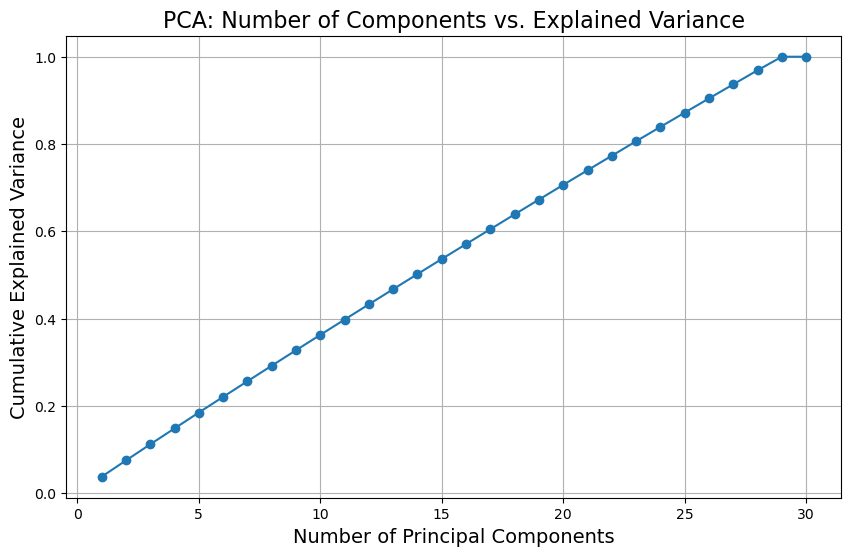

In [12]:
stacked_signatures_np = stacked_signatures.detach().cpu().numpy()
print(f'Stacked signatures in numpy: {stacked_signatures_np.shape}')

scaler = StandardScaler()
signatures_np = scaler.fit_transform(stacked_signatures_np)

# Apply PCA to reduce dimensionality
pca = PCA()
pca.fit(signatures_np)
signatures_pca = pca.transform(signatures_np)
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance.cumsum()

num_components_95 =  next(i for i, total in enumerate(cumulative_explained_variance) if total > 0.995)+1

print(f"Number of components : {num_components_95}")
reduced_space= signatures_pca[:,:num_components_95]
print(f'PCA Reduced space: {reduced_space.shape}')


# Plot variance explained vs. number of components
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='-')
plt.xlabel("Number of Principal Components", fontsize=14)
plt.ylabel("Cumulative Explained Variance", fontsize=14)
plt.title("PCA: Number of Components vs. Explained Variance", fontsize=16)
plt.grid()
plt.show()


# To determine which locations and which subwinds contribute the most to the PCA modes

In [44]:
components = pca.components_
unique_interaction_terms = set()

for i, component in enumerate(components):
    most_contributing_feature =np.argmax(np.abs(component)) 
    win= most_contributing_feature // signatures[0][0].shape[1]
    col_within_window = most_contributing_feature % signatures[0][0].shape[1]

    depth, interaction_term = pathsig.map_column_to_interaction(col_within_window, channels=locations, max_depth=2)
    unique_interaction_terms.add(interaction_term)

    print(f"Principal Component {i+1}: Feature {most_contributing_feature} is the most important Depth {depth}, window {win}, Interaction Term: {interaction_term}")

unique_values = set()

for term in unique_interaction_terms:
    unique_values.update(term)

unique_values = sorted(unique_values)

print("Top contributing locations Unique:", unique_values)
print(len(unique_values))

Principal Component 1: Feature 12814 is the most important Depth 1, window 4, Interaction Term: (810,)
Principal Component 2: Feature 19129 is the most important Depth 1, window 6, Interaction Term: (1123,)
Principal Component 3: Feature 11946 is the most important Depth 1, window 3, Interaction Term: (2943,)
Principal Component 4: Feature 10352 is the most important Depth 1, window 3, Interaction Term: (1349,)
Principal Component 5: Feature 16632 is the most important Depth 1, window 5, Interaction Term: (1627,)
Principal Component 6: Feature 3540 is the most important Depth 1, window 1, Interaction Term: (539,)
Principal Component 7: Feature 19121 is the most important Depth 1, window 6, Interaction Term: (1115,)
Principal Component 8: Feature 20031 is the most important Depth 1, window 6, Interaction Term: (2025,)
Principal Component 9: Feature 1890 is the most important Depth 1, window 0, Interaction Term: (1890,)
Principal Component 10: Feature 1751 is the most important Depth 1, 

(1, tensor(-61.7480), tensor(153.9811))
(2, tensor(7.0053), tensor(46.5787))
(3, tensor(-16.8496), tensor(159.0255))
(4, tensor(-31.3746), tensor(136.4934))
(5, tensor(37.8786), tensor(-66.6136))


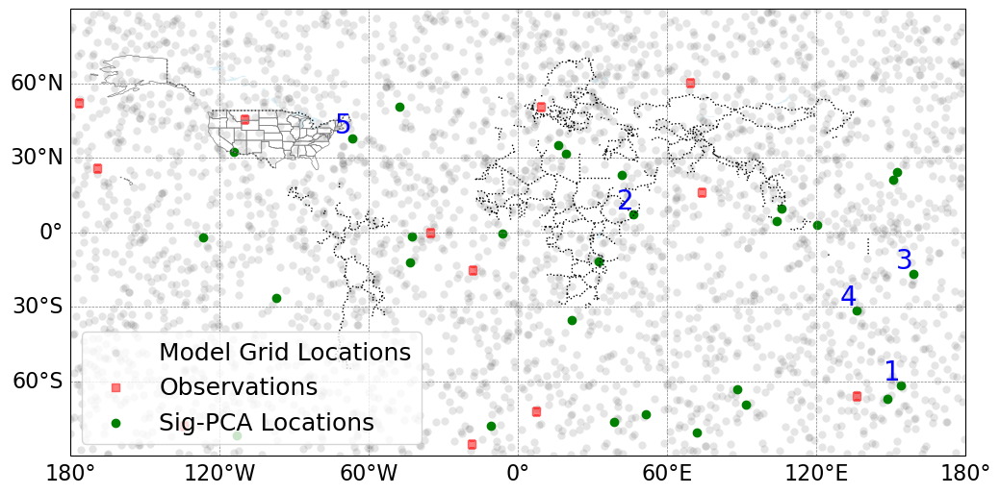

In [46]:
plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.scatter(long_flat, lat_flat, c='black', marker='o', edgecolor='white', alpha=0.1, label='Model Grid Locations', transform=ccrs.PlateCarree())
ax.scatter(lon_obs, lat_obs, c='red', marker='s', alpha=0.5, label='Observations', transform=ccrs.PlateCarree())
ax.scatter(long_flat[unique_values], lat_flat[unique_values], c='green', marker='o', label='Sig-PCA Locations', transform=ccrs.PlateCarree())

label_indices = {1, 2,3,4,5}
selected_points = [(lon, lat) for idx, (lon, lat) in enumerate(zip(long_flat[unique_values], lat_flat[unique_values]), start=1) if idx in label_indices]

for new_idx, (lon, lat) in enumerate(selected_points, start=1):
    print((new_idx, lat,lon))
    ax.text(lon, lat, str(new_idx), fontsize=20, ha='right', va='bottom', color='blue', transform=ccrs.PlateCarree())

# Add natural features for context
ax.add_feature(cfeature.LAND, facecolor='white')
ax.add_feature(cfeature.LAKES, facecolor='lightblue', alpha=0.4)  # Lakes with transparency
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=1, edgecolor='black')
ax.add_feature(cfeature.STATES, edgecolor='gray', linewidth=0.5)


# Add a grid for better readability
gridlines = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--')
gridlines.top_labels = False
gridlines.right_labels = False

# Increase axis label font size
gridlines.xlabel_style = {'size': 16}  # X-axis label font size
gridlines.ylabel_style = {'size': 16}  # Y-axis label font size
ax.tick_params(axis='both', which='major', labelsize=16)  # Increase tick label font size

plt.legend(loc='lower left', fontsize=18)
plt.show()


Processing hierarchical dyadic window depth 1 with 1 sub-windows
Sub-window 1 : Start = 0, End = 25
Processing hierarchical dyadic window depth 2 with 2 sub-windows
Sub-window 1 : Start = 0, End = 12
Sub-window 2 : Start = 12, End = 25
Processing hierarchical dyadic window depth 3 with 4 sub-windows
Sub-window 1 : Start = 0, End = 6
Sub-window 2 : Start = 6, End = 12
Sub-window 3 : Start = 12, End = 18
Sub-window 4 : Start = 18, End = 25


Location 28 fluctuations: [0.31848546862602234, 0.3044854998588562, 0.45351776480674744, 0.26415830850601196, 0.44732004404067993, 0.4433386027812958, 0.4423501491546631]
Location 93 fluctuations: [0.2798083424568176, 0.2649267911911011, 0.4477425217628479, 0.2882979214191437, 0.43067076802253723, 0.436694473028183, 0.3869336247444153]
Location 539 fluctuations: [0.2781618535518646, 0.27478712797164917, 0.37168005108833313, 0.2476188689470291, 0.3535155653953552, 0.32639288902282715, 0.4076850712299347]
Location 677 fluctuations: [0.29855144023895264, 0.2876288592815399, 0.43695682287216187, 0.2829509675502777, 0.4137852191925049, 0.40506240725517273, 0.47938597202301025]
Location 721 fluctuations: [0.31803083419799805, 0.29005658626556396, 0.4564715027809143, 0.3187996447086334, 0.39687538146972656, 0.3798375129699707, 0.4136756956577301]


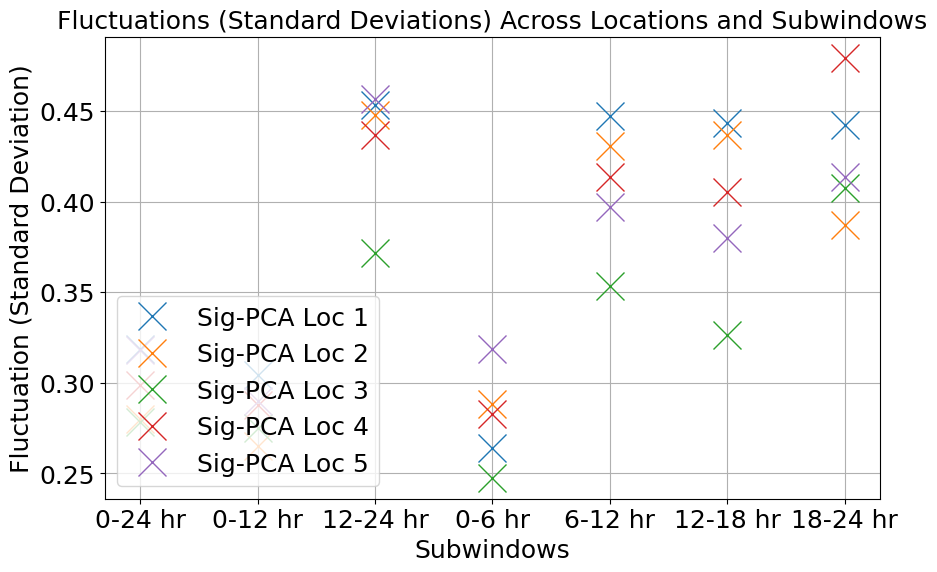

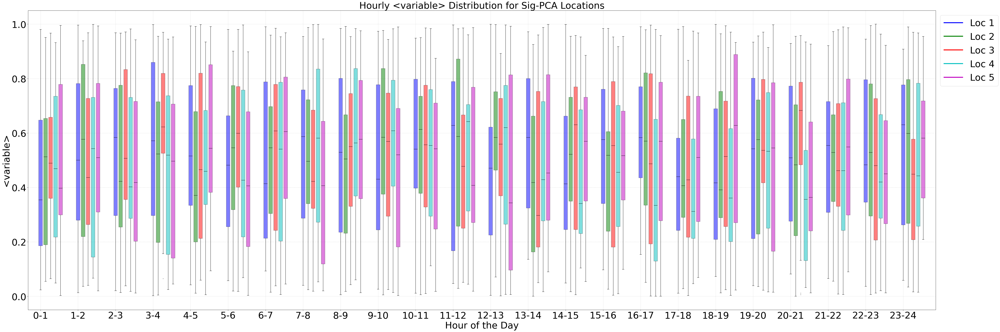

In [48]:
sigpca_values = []

for i in label_indices:
    sigpca = unique_values[i]  
    sigpca_values.append(sigpca)


depth = 3
num_depths = len(windows[0:depth])  
max_sub_windows = max(len(window_list) for window_list in windows[0:depth])  

fig, axes = plt.subplots(num_depths, max_sub_windows, figsize=(100, 80), squeeze=False)

sub_window_counter = 0

labels = [f'Sig-PCA Loc {i +1}' for i in range(len(label_indices))]  
fluctuations = {}

for depth_idx, window_list in enumerate(windows[0:depth]):
    print(f"Processing hierarchical dyadic window depth {depth_idx + 1} with {len(window_list)} sub-windows")
    
    for sub_window_idx, pair in enumerate(window_list):
        start_idx, end_idx = pair.start, pair.end
        print(f"Sub-window {sub_window_idx + 1} : Start = {start_idx}, End = {end_idx}")

        signature = signatures[depth_idx][sub_window_idx]

        for i in sigpca_values:  
            loc_fluctuation = signature[:, i].std().item()  
            if i not in fluctuations:
                fluctuations[i] = []
            fluctuations[i].append(loc_fluctuation)

       
        ax = axes[depth_idx, sub_window_idx]  
        for i in sigpca_values: 
            num_rows=signature.shape[0]
            x_hours = np.arange(num_rows) * hours
            x_days = x_hours / 24 
            ax.plot(x_days, signature[:, i].numpy()) 
                
        ax.set_xticks(np.arange(0, np.max(x_days) + 1, 5))  
        ax.set_title(f'Sub-window {sub_window_idx + 1}\nHourly Steps {start_idx}-{end_idx}', fontsize=100)
        ax.set_xlabel('Days', fontsize=100)
        ax.set_ylabel('Signature Value', fontsize=100)

        ax.tick_params(axis='both', which='major', labelsize=100)

for depth_idx in range(num_depths):
    for sub_window_idx in range(len(windows[depth_idx]), max_sub_windows):
        fig.delaxes(axes[depth_idx, sub_window_idx])

fig.legend(labels, loc='center right', fontsize=100, title="Signature Terms", title_fontsize=100, bbox_to_anchor=(0.9, 0.5))

plt.tight_layout(rect=[0, 0, 0.9, 1])  
plt.show()

for loc, fluct in fluctuations.items():
    print(f"Location {loc} fluctuations: {fluct}")

subwindow_labels = ['0-24 hr', '0-12 hr', '12-24 hr', '0-6 hr', '6-12 hr', '12-18 hr', '18-24 hr']

plt.figure(figsize=(10, 6))

for i, (loc, fluct) in enumerate(fluctuations.items(), start=1):
    plt.plot(range(1, 8), fluct,marker='x',markersize=20, linestyle='', label=f'Sig-PCA Loc {i}')

plt.title("Fluctuations (Standard Deviations) Across Locations and Subwindows", fontsize=18)
plt.xlabel("Subwindows", fontsize=18)
plt.ylabel("Fluctuation (Standard Deviation)", fontsize=18)
plt.xticks(range(1, 8), subwindow_labels, fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="lower left", fontsize=18)
plt.grid(True)
plt.show()

hourly_steps = np.arange(0, hours) 

data_np = model_tensor.numpy()  

colors = ['b', 'g', 'r', 'c', 'm'] 

plt.figure(figsize=(60, 20)) 

for i, loc in enumerate(sigpca_values):
    if i >= data_np.shape[0]:  
        continue
    
    wind_speeds = data_np[:, :, loc].T  
    
    plt.boxplot(wind_speeds.T, positions=(hourly_steps*1.5) + (i * 0.2), widths=0.15, patch_artist=True, 
                boxprops=dict(facecolor=colors[i], alpha=0.5), 
                medianprops=dict(color="black"), flierprops=dict(marker='o', markersize=2, alpha=0.5))

# Customize the plot
plt.title("Hourly <variable> Distribution for Sig-PCA Locations", fontsize=40)
plt.xlabel("Hour of the Day", fontsize=40)
plt.ylabel("<variable>", fontsize=40)
plt.xticks(hourly_steps*1.5, labels=[f"{h}-{h+1}" for h in hourly_steps], fontsize=40)
plt.yticks(fontsize=40)  # Increase y-axis tick font size
plt.grid(True, linestyle="--", alpha=0.5)

legend_handles = [Line2D([0], [0], color=color, lw=4) for color in colors]

plt.legend(legend_handles, [f"Loc {i+1}" for i in range(len(sigpca_values))], loc="upper left", fontsize=40, bbox_to_anchor=(1, 1), ncol=1)

plt.tight_layout()

plt.show()


# Reconstruction Neural network: training on 4% dataset+sigpca+Deep Kriging basis functions to reconstruct model data

In [53]:
lon_sigpca_1=long_flat[unique_values]
lat_sigpca_1=lat_flat[unique_values]


length=days

num_basis = [10**2,19**2,37**2]
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]

phigrid = np.zeros((len(lat_flat), sum(num_basis)))
llong=np.array(long_flat)
llat= np.array(lat_flat)
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
basis_size=0
normalized_lon = (llong-min(llong))/(max(llong)-min(llong))
normalized_lat = (llat-min(llat))/(max(llat)-min(llat))
for res in range(len(num_basis)):
    theta = 1/np.sqrt(num_basis[res])*2.5
    knots_x, knots_y = np.meshgrid(knots_1dx[res],knots_1dy[res])
    knots = np.column_stack((knots_x.flatten(),knots_y.flatten()))
    for i in range(num_basis[res]):
        d = np.linalg.norm(np.vstack((normalized_lon,normalized_lat)).T-knots[i,:],axis=1)/theta
        for j in range(len(d)):
            if d[j] >= 0 and d[j] <= 1:
                phigrid[j,i + basis_size] = (1-d[j])**6 * (35 * d[j]**2 + 18 * d[j] + 3)/3
            else:
                phigrid[j,i + basis_size] = 0
    basis_size = basis_size + num_basis[res]

## Remove the all-zero columns
idx_zero = np.array([], dtype=int)
for i in range(phigrid.shape[1]):
    if sum(phigrid[:,i]!=0)==0:
        idx_zero = np.append(idx_zero,int(i))
phigrid_reduce = np.delete(phigrid,idx_zero,1)


augmented_cols = []

for i in range(len(lat_flat)):
    chunk = reduced_space
    lat_lon_column = np.column_stack((np.full(length, lat_flat[i]), np.full(length, long_flat[i])))
    basiscolumn= np.tile(phigrid[i, :], (length, 1))
    augmented_chunk = np.hstack((chunk, lat_lon_column,basiscolumn))
    augmented_cols.append(augmented_chunk)

testinput = np.vstack(augmented_cols)
testinput_tensor = torch.tensor(testinput, dtype=torch.float32)
print(f"Test input shape model grid: {testinput_tensor.shape}")

testtarget_subset = np.vstack([model_tensor[:, :, i] for i in range(model_tensor.shape[2])])
testtarget_tensor = torch.tensor(testtarget_subset, dtype=torch.float32)
print(f"Test output shape model grid: {testtarget_tensor.shape}")


Test input shape model grid: torch.Size([90000, 1861])
Test output shape model grid: torch.Size([90000, 24])


In [57]:
# Training--# Define sample sizes
percent = 4
total_size = locations
sample_size = round((percent / 100) * total_size)

mse_results = []
length=days
num_basis = [10**2,19**2,37**2]
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]

# Randomly select a subset of lat/lon points
np.random.seed(4)
indices = np.random.choice(len(lat_flat), sample_size, replace=False)
lat_subset = lat_flat[indices]
long_subset = long_flat[indices]

llong=np.array(long_subset)
llat= np.array(lat_subset)

normalized_lon = (llong-min(llong))/(max(llong)-min(llong))
normalized_lat = (llat-min(llat))/(max(llat)-min(llat))

##Wendland kernel
basis_size = 0
phi = np.zeros((len(lat_subset), sum(num_basis)))
for res in range(len(num_basis)):
    theta = 1/np.sqrt(num_basis[res])*2.5
    knots_x, knots_y = np.meshgrid(knots_1dx[res],knots_1dy[res])
    knots = np.column_stack((knots_x.flatten(),knots_y.flatten()))
    for i in range(num_basis[res]):
        d = np.linalg.norm(np.vstack((normalized_lon,normalized_lat)).T-knots[i,:],axis=1)/theta
        for j in range(len(d)):
            if d[j] >= 0 and d[j] <= 1:
                phi[j,i + basis_size] = (1-d[j])**6 * (35 * d[j]**2 + 18 * d[j] + 3)/3
            else:
                phi[j,i + basis_size] = 0
    basis_size = basis_size + num_basis[res]

## Remove the all-zero columns
idx_zero = np.array([], dtype=int)
for i in range(phi.shape[1]):
    if sum(phi[:,i]!=0)==0:
        idx_zero = np.append(idx_zero,int(i))
phi_reduce = np.delete(phi,idx_zero,1)

# Prepare input data
augmented_cols = []
for i in range(sample_size):
    lat_lon_column = np.column_stack((np.full(length, lat_subset[i]), np.full(length, long_subset[i])))
    basis_column = np.tile(phi[i, :], (length, 1))
    augmented_chunk = np.hstack((reduced_space, lat_lon_column, basis_column))
    augmented_cols.append(augmented_chunk)

input_subset = np.vstack(augmented_cols)
target_subset = np.vstack([model_tensor[:, :, i] for i in indices])

inputs_tensor = torch.tensor(input_subset, dtype=torch.float32)
targets_tensor = torch.tensor(target_subset, dtype=torch.float32)
print(f'Input shape: {inputs_tensor.shape}')
print(f'Output model at fixed grid shape: {targets_tensor.shape}')

# Train the neural network
model = nnmodule.SimpleNNpos(input_subset.shape[1], target_subset.shape[1])
optimizer = optim.Adam(model.parameters(), lr=0.01)
criterion = nn.MSELoss()

num_epochs = 100  # Reduce training iterations for efficiency
for epoch in range(num_epochs):
    optimizer.zero_grad()
    outputs = model(inputs_tensor)
    loss = criterion(outputs, targets_tensor)
    loss.backward()
    optimizer.step()
    if (epoch + 1) % 100 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')
        
with torch.no_grad():
    predictions_val = model(testinput_tensor)



Input shape: torch.Size([3600, 1861])
Output model at fixed grid shape: torch.Size([3600, 24])
Epoch [100/100], Loss: 0.0788


Sample size: 120,  MSE between reconstructed model and true model on entire grid: 0.0856
(3000, 720)


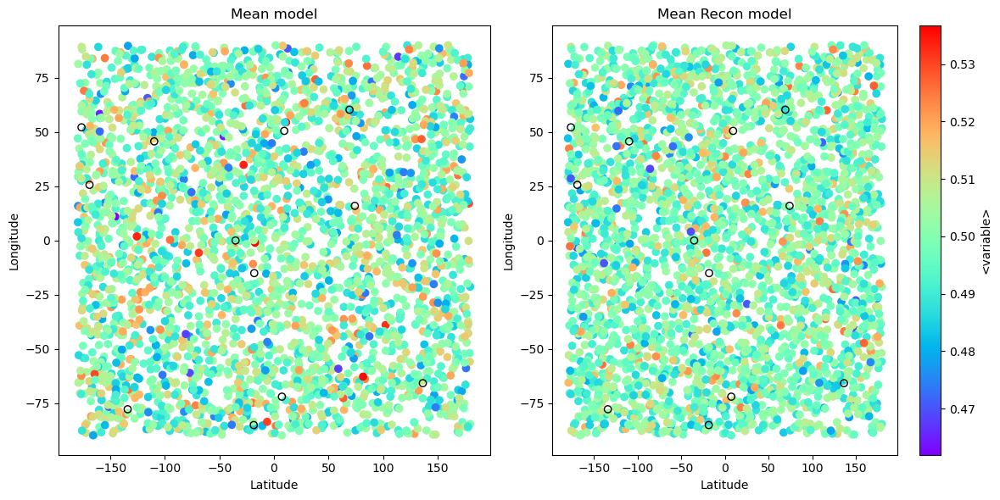

In [69]:
mse = F.mse_loss(predictions_val, testtarget_tensor).item()
print(f"Sample size: {sample_size},  MSE between reconstructed model and true model on entire grid: {mse:.4f}")

nwpgrid=np.vstack([model_tensor[:, :, i] for i in range(model_tensor.shape[2])])

obstestgrid = np.zeros((flattened_model.shape[0], flattened_model.shape[1]))

for i in range(flattened_model.shape[0]):
    blocknwp = flattened_model[i, :]
    flattened_series_nwp = blocknwp.flatten()

    blockpredsgrid = predictions_val[i*length:(i+1)*length, :]
    flattened_series_predsgrid = blockpredsgrid.flatten()
    obstestgrid[i, :] = flattened_series_predsgrid
    
print(obstestgrid.shape)

sigpca_dk_nwp_4percent=obstestgrid

mean_values = np.mean(flattened_model, axis=1)
variance_values = np.std(flattened_model, axis=1)

mean_values_obs = np.mean(obstestgrid, axis=1)
variance_values_obs = np.std(obstestgrid, axis=1)

vmin = min(mean_values.min(), mean_values_obs.min())
vmax = max(mean_values.max(), mean_values_obs.max())

vminva = min(variance_values.min(), variance_values_obs.min())
vmaxva = max(variance_values.max(), variance_values_obs.max())


plt.figure(figsize=(12, 6))  
plt.subplot(1, 2, 1)
sc1=plt.scatter(long_flat, lat_flat, c=mean_values, cmap='rainbow', vmin=vmin, vmax=vmax)
plt.scatter(lon_obs, lat_obs, facecolors='none', edgecolors='black',  marker='o', label='Observation Points')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Mean model')

plt.subplot(1, 2, 2)
sc2=plt.scatter(long_flat, lat_flat, c=mean_values_obs, cmap='rainbow', vmin=vmin, vmax=vmax)
plt.scatter(lon_obs, lat_obs, facecolors='none', edgecolors='black',  marker='o', label='Observation Points')
plt.colorbar(sc2,label='<variable>')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Mean Recon model')

plt.tight_layout()
plt.show()


# Correction NN: Train only on 4% of model and output obs across Grid with Sig-PCA+DK

In [72]:
closest_lats = []
closest_lons = []
closest_indices = []
for latc, lonc in zip(lat_obs, lon_obs):
    # Calculate the distance to each station in lat_flat and long_flat
    distances = np.sqrt((lat_flat - latc)**2 + (long_flat - lonc)**2)
    closest_index = np.argmin(distances)  # Find the index of the minimum distance
    
    # Append the closest latitude, longitude, and index
    closest_lats.append(lat_flat [closest_index])
    closest_lons.append(long_flat[closest_index])
    closest_indices.append(closest_index)

# Convert to numpy arrays for easy handling
closest_lats = np.array(closest_lats)
closest_lons = np.array(closest_lons)
closest_indices = np.array(closest_indices)
print(len(closest_indices))

12


In [74]:
length=days

num_basis = [10**2,19**2,37**2]
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]

phigrid = np.zeros((len(lat_flat), sum(num_basis)))
llong=np.array(long_flat)
llat= np.array(lat_flat)
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
basis_size=0
normalized_lon = (llong-min(llong))/(max(llong)-min(llong))
normalized_lat = (llat-min(llat))/(max(llat)-min(llat))
for res in range(len(num_basis)):
    theta = 1/np.sqrt(num_basis[res])*2.5
    knots_x, knots_y = np.meshgrid(knots_1dx[res],knots_1dy[res])
    knots = np.column_stack((knots_x.flatten(),knots_y.flatten()))
    for i in range(num_basis[res]):
        d = np.linalg.norm(np.vstack((normalized_lon,normalized_lat)).T-knots[i,:],axis=1)/theta
        for j in range(len(d)):
            if d[j] >= 0 and d[j] <= 1:
                phigrid[j,i + basis_size] = (1-d[j])**6 * (35 * d[j]**2 + 18 * d[j] + 3)/3
            else:
                phigrid[j,i + basis_size] = 0
    basis_size = basis_size + num_basis[res]

## Romove the all-zero columns
idx_zero = np.array([], dtype=int)
for i in range(phigrid.shape[1]):
    if sum(phigrid[:,i]!=0)==0:
        idx_zero = np.append(idx_zero,int(i))
phigrid_reduce = np.delete(phigrid,idx_zero,1)


augmented_cols = []

for i in range(len(lat_flat)):
    chunk = reduced_space
    
    lat_lon_column = np.column_stack((np.full(length, lat_flat[i]), np.full(length, long_flat[i])))
    basiscolumn= np.tile(phigrid[i, :], (length, 1))
    augmented_chunk = np.hstack((chunk, lat_lon_column,basiscolumn))
    
    augmented_cols.append(augmented_chunk)

testinput = np.vstack(augmented_cols)
testinput_tensor = torch.tensor(testinput, dtype=torch.float32)
print(f"Test input shape model grid: {testinput_tensor.shape}")

testtarget_subset = np.vstack([model_tensor[:, :, i] for i in range(model_tensor.shape[2])])
testtarget_tensor = torch.tensor(testtarget_subset, dtype=torch.float32)
print(f"Test output shape model grid: {testtarget_tensor.shape}")


Test input shape model grid: torch.Size([90000, 1861])
Test output shape model grid: torch.Size([90000, 24])


In [85]:
num_basis = [10**2,19**2,37**2]
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]

llong=np.array(lon_obs)
llat= np.array(lat_obs)

normalized_lon = (llong-min(llong))/(max(llong)-min(llong))
normalized_lat = (llat-min(llat))/(max(llat)-min(llat))

##Wendland kernel
basis_size = 0
phi = np.zeros((len(lat_obs), sum(num_basis)))
for res in range(len(num_basis)):
    theta = 1/np.sqrt(num_basis[res])*2.5
    knots_x, knots_y = np.meshgrid(knots_1dx[res],knots_1dy[res])
    knots = np.column_stack((knots_x.flatten(),knots_y.flatten()))
    for i in range(num_basis[res]):
        d = np.linalg.norm(np.vstack((normalized_lon,normalized_lat)).T-knots[i,:],axis=1)/theta
        for j in range(len(d)):
            if d[j] >= 0 and d[j] <= 1:
                phi[j,i + basis_size] = (1-d[j])**6 * (35 * d[j]**2 + 18 * d[j] + 3)/3
            else:
                phi[j,i + basis_size] = 0
    basis_size = basis_size + num_basis[res]

idx_zero = np.array([], dtype=int)
for i in range(phi.shape[1]):
    if sum(phi[:,i]!=0)==0:
        idx_zero = np.append(idx_zero,int(i))
phi_reduce = np.delete(phi,idx_zero,1)


num_basis = [10**2,19**2,37**2]

phigrid = np.zeros((len(lat_flat), sum(num_basis)))
llong=np.array(long_flat)
llat= np.array(lat_flat)
knots_1dx = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
knots_1dy = [np.linspace(0,1,int(np.sqrt(i))) for i in num_basis]
basis_size=0
normalized_lon = (llong-min(llong))/(max(llong)-min(llong))
normalized_lat = (llat-min(llat))/(max(llat)-min(llat))
for res in range(len(num_basis)):
    theta = 1/np.sqrt(num_basis[res])*2.5
    knots_x, knots_y = np.meshgrid(knots_1dx[res],knots_1dy[res])
    knots = np.column_stack((knots_x.flatten(),knots_y.flatten()))
    for i in range(num_basis[res]):
        d = np.linalg.norm(np.vstack((normalized_lon,normalized_lat)).T-knots[i,:],axis=1)/theta
        for j in range(len(d)):
            if d[j] >= 0 and d[j] <= 1:
                phigrid[j,i + basis_size] = (1-d[j])**6 * (35 * d[j]**2 + 18 * d[j] + 3)/3
            else:
                phigrid[j,i + basis_size] = 0
    basis_size = basis_size + num_basis[res]

idx_zero = np.array([], dtype=int)
for i in range(phigrid.shape[1]):
    if sum(phigrid[:,i]!=0)==0:
        idx_zero = np.append(idx_zero,int(i))
phigrid_reduce = np.delete(phigrid,idx_zero,1)

length=model_tensor.shape[0]
augmented_cols = []
for i in range(len(lat_obs)):
    chunk = reduced_space
    lat_lon_column = np.column_stack((np.full(length, lat_obs[i]), np.full(length, lon_obs[i])))
    basiscolumn= np.tile(phi[i, :], (length, 1))
    augmented_chunk = np.hstack((chunk, lat_lon_column,basiscolumn))
    augmented_cols.append(augmented_chunk)

input = np.vstack(augmented_cols)
print(f'Training on OBS lat long and sig PCA: {input.shape}')

recon_nwp_3332=np.zeros(model_tensor.shape)
for i in range(model_tensor.shape[2]):
    recon_nwp_3332[:, :, i] = torch.from_numpy(sigpca_dk_nwp_4percent[i, :].reshape(model_tensor.shape[0],model_tensor.shape[1])).float()
print(f'Shape of reconstructed model : {recon_nwp_3332.shape}')

recon_nwp_3332_closestin=np.vstack([recon_nwp_3332[:, :, i] for i in closest_indices])
print(f'Shape of reconstructed model at obs locations: {recon_nwp_3332_closestin.shape}')

# output is OBS-reconstructed model[ closest indices]
output= obsstack-recon_nwp_3332_closestin
print(f'Correction output: {output.shape}')

input_size = input.shape[1]
output_size = output.shape[1]


nwpobsgrid=model_tensor[:,:,closest_indices]
print(f'nwpobsgrid shape: {nwpobsgrid.shape}')
nwpstack=np.vstack([nwpobsgrid[:, :, i] for i in range(nwpobsgrid.shape[2])])
print(f"model stacked shape: {nwpstack.shape}") 
nwpstacktensor= torch.tensor(nwpstack, dtype=torch.float32)
print(f"model stacked tensor shape: {nwpstacktensor.shape}") 


model = nnmodule.SimpleNN(input_size,output_size)

optimizer = optim.Adam(model.parameters(), lr=0.01) #0.01 is good

inputs_tensor=torch.tensor(input, dtype=torch.float32)
print(f"Input shape: {inputs_tensor.shape}")
targets_tensor=torch.tensor(output, dtype=torch.float32)
print(f"Output shape : {targets_tensor.shape}")

num_epochs = 100

for epoch in range(num_epochs):
    optimizer.zero_grad()  
    outputs = model(inputs_tensor) 
    loss = nnmodule.custom_loss(outputs, targets_tensor,nwpstacktensor)
    loss.backward()  
    optimizer.step()  
    if (epoch + 1) % 100 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')
        

with torch.no_grad(): 
    predictions = model(testinput_tensor) 

targets_np = targets_tensor.cpu().numpy() 
predictions_np = predictions.cpu().numpy() 


obstestgrid_recon = np.zeros((flattened_model.shape[0], flattened_model.shape[1]))

for i in range(flattened_model.shape[0]):
    blocknwp = sigpca_dk_nwp_4percent[i, :]
    flattened_series_nwp_recon = blocknwp.flatten()

    blockpredsgrid = predictions_np[i*length:(i+1)*length, :]
    flattened_series_predsgrid = blockpredsgrid.flatten()

    obstestgrid_recon[i, :] = flattened_series_nwp_recon + flattened_series_predsgrid

print(obstestgrid_recon.shape)

sigpca_dk_grid_corr_4percent=obstestgrid_recon


Training on OBS lat long and sig PCA: (360, 1861)
Shape of reconstructed model : (30, 24, 3000)
Shape of reconstructed model at obs locations: (360, 24)
Correction output: (360, 24)
nwpobsgrid shape: torch.Size([30, 24, 12])
model stacked shape: (360, 24)
model stacked tensor shape: torch.Size([360, 24])
Input shape: torch.Size([360, 1861])
Output shape : torch.Size([360, 24])
Epoch [100/100], Loss: 0.0802
(3000, 720)


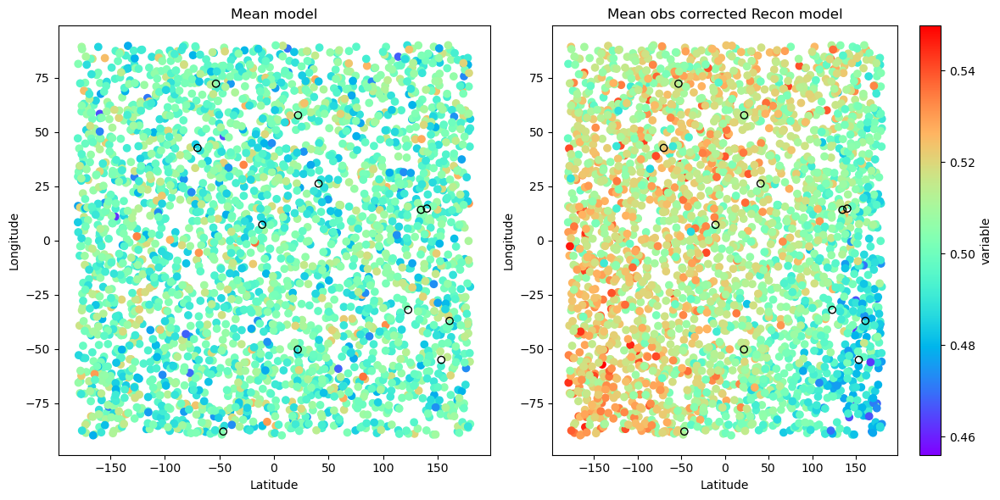

In [89]:
mean_values = np.mean(flattened_model, axis=1)
variance_values = np.std(flattened_model, axis=1)

mean_values_obs = np.mean(obstestgrid_recon, axis=1)
variance_values_obs = np.std(obstestgrid_recon, axis=1)

vmin = min(mean_values.min(), mean_values_obs.min())
vmax = max(mean_values.max(), mean_values_obs.max())

vminva = min(variance_values.min(), variance_values_obs.min())
vmaxva = max(variance_values.max(), variance_values_obs.max())


# Plot the mean heatmap using scatter
plt.figure(figsize=(12, 6))  
plt.subplot(1, 2, 1)
sc1=plt.scatter(long_flat, lat_flat, c=mean_values, cmap='rainbow', vmin=vmin, vmax=vmax)
plt.scatter(lon_obs, lat_obs, facecolors='none', edgecolors='black',  marker='o', label='Observation Points')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Mean model')

plt.subplot(1, 2, 2)
sc2=plt.scatter(long_flat, lat_flat, c=mean_values_obs, cmap='rainbow', vmin=vmin, vmax=vmax)
plt.scatter(lon_obs, lat_obs, facecolors='none', edgecolors='black',  marker='o', label='Observation Points')
plt.colorbar(sc2,label='variable')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Mean obs corrected Recon model')

plt.tight_layout()
plt.show()
